# **Проект: Тестовое задание на позицию BI аналитика"**

_________________
Данная тетрадка - рабочая.

Заказчик не будет с ней знакомиться.

Следовательно, итоговых выводов здесь не будет.
_____________


## **00. Вводная часть: описание проекта (информационный раздел)**

**Заказчик:**

АНО Центр развития "Среда возможностей" (г. Москва)

**Сфера деятельности заказчика:**

- государственное учреждение,
- занимается мониторингом земельных участков на территории города Москвы,
- основные направления деятельности включают организацию выездных проверок и выявление незаконных строительных объектов.

**Данные для анализа:**

- Обширный реестр земельных участков в городе Москве, содержащий разнообразную информацию о каждом участке.
- Файл данных о проведенных выездных проверках.

**Важно:**

Данные должны быть сгруппированы по округам города Москвы.

**Задачи BI аналитика:**

- обеспечить высокую степень детализации географических координат для города Москвы (добавить координаты г.Москва с высокой детализацией).

- заказчика интересует информация, разбитая по округам, включая:
    - Общее количество объектов.
    - Способы их классификации.
    - Общие характеристики объектов.
    - Локализацию объектов.
    - Количество и распределение проверок по объектам.
    - Распределение нагрузки между проверками.
    - Частота проведения проверок и количеств выявленных нарушений.
- выявить районы, которые подвергаются проверкам чаще других,
- выявить, существуют ли районы с повышенным количеством нарушений.

Выбор итогового формата работы свободный.

**Критично:**
- уложиться в дедлайн проекта 2 дня;
- предложить рекомендации заказчику.

**Критерии оценки:**

- Умение кандидата проводить аналитический анализ и визуализацию данных.
- Предпочтительно предоставление результатов анализа в форме дашборда и презентации с выводами ( ограничений по выбору инструмента - нет).
- Визуализация данных на карте Москвы, с высокой степенью детализации, будет считаться значительным преимуществом

## **0. Импорт библиотек, объявление функций (технический раздел)**

### **0.1. Импорт библиотек**

In [ ]:
# Загрузим стандартные библиотеки
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
from datetime import datetime, timedelta
import plotly.express as px
from plotly import graph_objects as go
import re
import string
import warnings
import math as mth
from scipy import stats as st
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:,.2f}'.format)

In [ ]:
# Установка pandas-profiling
%%capture
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
# Импорт ProfileReport изи библиотеки pandas_profiling
from pandas_profiling import ProfileReport

### **0.2. Создание функций**

In [ ]:
# Объявим функцию col_hist для построения гистограмм числовых столбцов датафрейма
def maker_hist(col, n=10):
    plt.figure(figsize=(13, 3))
    sns.histplot(x = col, bins=n, kde=True, color='blue')
    plt.xlabel(f'{col.name}')
    plt.ylabel('Количество')
    plt.title(f'Гистограмм по столбцу {col.name}', size=14, color='darkblue')
    plt.show()

In [ ]:
# Объявим функцию по построению круговых диаграмм
def maker_pie(df, col1, col2, t, n=8):
    plt.figure(figsize=(10, 10))
    explode = [0.1]*df[col2].nunique()
    colors = sns.color_palette('GnBu')
    plt.pie(df[col1],
        labels = df[col2].unique(),
        colors = colors,
        autopct = '%0.1f%%',
        explode = explode,
        shadow = 'True',
        startangle = 90,
        textprops = {'color': 'black','fontsize':n},
        wedgeprops = {'linewidth': 7},
        #frame = 'true',
        center = (0.1,0.1),
        rotatelabels = False)
    plt.title(t, loc='center', size=18, color='darkblue', pad=40)
    #plt.legend(df[col2].unique(), bbox_to_anchor=(0.8, 1), loc='upper left', borderaxespad= 0)
    plt.show()

In [ ]:
# Объявим функцию для построения boxplot по столбцам датафрейма
def maker_boxplot(df, column, ax, ylabel, i=True):
    ax.boxplot(df[column], notch=True,
               patch_artist = True,
               showfliers = i ,
               boxprops=dict(facecolor='darkblue', alpha = 1),
               flierprops=dict(marker='o',
                               markersize=5,
                               markerfacecolor='red'),
               whiskerprops=dict(color='black'),
               medianprops=dict(color='yellow'))
    ax.set_xlabel(ylabel)
    ax.set_ylabel('Количество, ед.')
    ax.set_title(f'Boxplot {column}')

In [ ]:
# Объявим функцию maker_value_counts для изучения столбцов датафрейма с помощью метода value_counts()
def maker_value_counts(df, col):
    s1 = df[col].value_counts()
    s2 = df[col].value_counts(normalize=True)
    display(pd.concat([s1, s2], axis=1).sort_values(by='count', ascending=False))

In [ ]:
# Объявим функцию maker_pivot_table
def maker_pivot_table(df, ind, col, val, f):
    df_pivot_table = (df.pivot_table(index = ind,
                                     columns = col,
                                     values = val,
                                     aggfunc = f))
    df_pivot_table = df_pivot_table.fillna(0)
    df_pivot_table['total'] = df_pivot_table.sum(axis=1)
    df_pivot_table['%_total'] = round((df_pivot_table['total']/df_pivot_table['total'].sum())*100)
    (
    display(df_pivot_table.astype(int)
    .sort_values(by='total', ascending=False)
    .style.background_gradient(cmap='GnBu', axis=0))
    )

## **1. Загрузка и первичная обработка данных (подготовительный раздел)**

In [ ]:
# Сохраним ссылку на данные, которые хранятся на Github
url = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/09_sv_moc/test_data.xlsx'

### **1.1. Первый лист файла - tasks**

#### **1.1.1. Загрузка  и первичное знакомство с данными**

In [ ]:
# Загрузим файл и создадим датасет
tasks = pd.read_excel(url, header=1, sheet_name='Задачи')
tasks.head()

,№ п/п,Id задачи,Источник задачи,Округ,Район,Тематика,Тип объекта,№ распоряжения/поручения
0,15,1065090,Поручение,ЮАО,Чертаново Центральное,819/829-ПП (мероприятия по выявлению и пресече...,ЗУ,9052574
1,17,1065037,Поручение,NaN,NaN,819/829-ПП (мероприятия по выявлению и пресече...,ЗУ,9048265
2,32,1064674,ЭДО обращение ОИВ,ЦАО,Басманный,819/829-ПП (мероприятия по выявлению и пресече...,ЗУ,9072563
3,39,1064612,Поручение,ВАО,Богородское,819/829-ПП (мероприятия по выявлению и пресече...,ЗУ,9038375
4,44,1064538,Инструментальный мониторинг,ЮВАО,Печатники,819/829-ПП (мероприятия по выявлению и пресече...,ЗУ,9048253


In [ ]:
# Изучим датасет с помощью метода info()
tasks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2758 entries, 0 to 2757
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   № п/п                     2758 non-null   int64 
 1   Id задачи                 2758 non-null   int64 
 2   Источник задачи           2758 non-null   object
 3   Округ                     2672 non-null   object
 4   Район                     2661 non-null   object
 5   Тематика                  2758 non-null   object
 6   Тип объекта               2758 non-null   object
 7   № распоряжения/поручения  2758 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 172.5+ KB


In [ ]:
# Сформируем отчет pandas profiling
profile2 = ProfileReport(tasks, title="Pandas Profiling Report")
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Промежуточный вывод:**
- файл может быть не понадобиться для задач проекта;
- столбцы - кандидаты к удалению:
  - № п/п - дублирует Id задачи,
  - тематика - 1 значение;
  - районы - по ТЗ анализ в разрезе округов;
  - тип объекта - 2 знечения (99,9% и 0,01%);
- исходный файл имеет 8 столбцов и 2758 строк;
- полных дубликатов нет;
- есть пропуски в столбцах округ и район;
- названия столбцов не соответствуют стандарту.

Пока оставим файл без преобразований, ограничимся строго заданиями ТЗ.

Визуализации будем делать в Datalens.

В Pandas ограничимся созданием сводных таблиц.

In [ ]:
# Удалим столбцы, не востребованные в визуализации
tasks = tasks[['Id задачи', 'Источник задачи', 'Округ', 'Район', '№ распоряжения/поручения']]
tasks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2758 entries, 0 to 2757
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Id задачи                 2758 non-null   int64 
 1   Источник задачи           2758 non-null   object
 2   Округ                     2672 non-null   object
 3   Район                     2661 non-null   object
 4   № распоряжения/поручения  2758 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 107.9+ KB


#### **1.1.2. EDA**

In [ ]:
# Создадим сводную таблицу: АО - кол-во задач в разрезе источников задач
print('Сводная таблица: количество задач в разрезе АО и источников')
print()
maker_pivot_table(tasks, 'Округ', 'Источник задачи', 'Id задачи', 'count')

Сводная таблица: количество задач в разрезе АО и источников



Источник задачи,Инструментальный мониторинг,Камеральная проверка,Межведомственное взаимодействие,Мониторинг ОИВ,"Портал ""Наш город""",Поручение,ЭДО обращение ОИВ,ЭДО обращение граждан,total,%_total
Округ,,,,,,,,,,
ЦАО,4,57,4,8,0,324,160,3,560,21
ЮВАО,66,11,2,28,1,230,92,1,431,16
ВАО,0,6,6,30,1,254,28,3,328,12
ЮАО,0,16,1,2,0,234,4,2,259,10
СВАО,0,3,4,19,1,186,31,10,254,10
ЗАО,1,4,2,11,0,85,91,2,196,7
САО,0,2,0,1,0,162,24,2,191,7
СЗАО,1,3,7,2,2,92,37,0,144,5
ЗЕЛАО,0,24,5,2,0,62,3,1,97,4


_______________
_________________
**Промежуточный вывод:**

- наибольшее количество задач было выставлено в ЦАО и ЮВАО;
- наименьшее количество задач было выставлено в МО и ЮЗАО;
- наибольшее количество задач генерируют поручения и  ЭДО обращение ОИВ;
- наименьшее количество задач генерируют ЭДО обращение граждан	;
______________
____________

In [ ]:
# Создадим сводную таблицу: район - кол-во задач
# Посмотрим топ-10 районов по количеству задач
tasks_area = tasks.groupby('Район').agg({'Id задачи':'count'})
tasks_area.columns = ['count_id_task']
tasks_area['%_task'] = round((tasks_area['count_id_task']/tasks_area['count_id_task'].sum())*100)
(
    tasks_area.astype(int)
    .sort_values(by='count_id_task', ascending=False)
    .head(10)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,count_id_task,%_task
Район,,
Басманный,185,7
Таганский,95,4
Печатники,85,3
Тверской,84,3
Соколиная Гора,70,3
Хамовники,57,2
Марьино,55,2
Люблино,51,2
Отрадное,49,2


In [ ]:
# Создадим сводную таблицу: район - кол-во задач
# Посмотрим антитоп-10 районов по количеству задач
tasks_area = tasks.groupby('Район').agg({'Id задачи':'count'})
tasks_area.columns = ['count_id_task']
tasks_area['%_task'] = round((tasks_area['count_id_task']/tasks_area['count_id_task'].sum())*100)
(
    tasks_area.astype(int)
    .sort_values(by='count_id_task')
    .head(10)
    .style
    .background_gradient(cmap='GnBu', axis=0)
)

,count_id_task,%_task
Район,,
Истринский,1,0
Ломоносовский,1,0
Проспект Вернадского,1,0
Северное Бутово,1,0
Академический,2,0
Кленовское,2,0
Марфино,2,0
Нагатинский Затон,2,0
Филимонковское,2,0


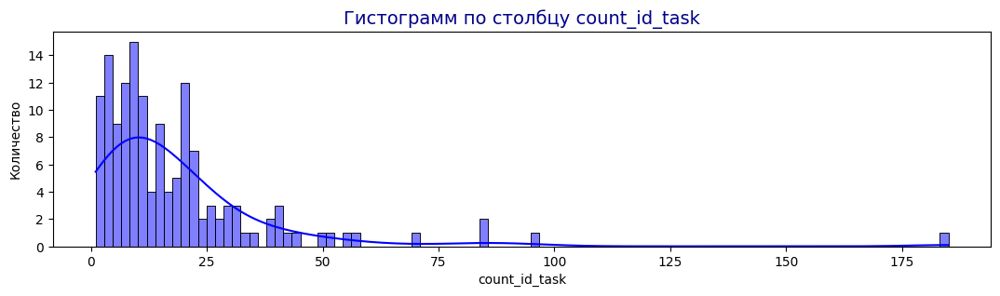

In [ ]:
# Посмотрим распределение количества задач по районам с помощью гистограммы
maker_hist(tasks_area['count_id_task'], n=100)

______
__________
**Промежуточный вывод:**

Не знаю чем выделяется Басманный район, но количество задач в нем в разы больше, чем в других районах.

_________
_________

In [ ]:
# Выгрузим датасет tasks
#tasks.to_csv('/content/drive/MyDrive/DATA/tasks.csv', index = False)

### **1.2. Загрузим второй лист файла - events**

#### **1.2.1. Загрузка  и первичное знакомство с данными**

In [ ]:
# Загрузим файл и создадим датасет
events = pd.read_excel(url, header=1, sheet_name='Мероприятия')
events.head()

,№ п/п,Идентификатор мероприятия,№ проверки,Дата создания карточки,Вид мероприятия,Дата обновления карточки,Дата проверки/обсл,Дата акта,Продолжительность (час),Время начала осмотра,Время завершения осмотра,Верифицировано,Состояние верификации,Дата верификации,Тип проверки/обследования,Результат,Наличие нарушения,Статьи нарушений,Наличие предостережения,Машино-место,Проверка/обсл. в отношении,Фактическое использование,Обращение на портал «Наш город»,Комплексное использование,"Площадь факт. исп., кв.м.",Отказ от ознакомления с актом,Округ,Район,Тип объекта,Площадь объекта,Право пользования,Площадь пресечения,Ведется строительство,Пресечено строительство,Строительство возобновлено,Незавершенное строительство,Наличие признаков угроз,Признаки угроз,ID НТО,ID объекта самостроя,Нарушение ОАТИ
0,3,1147581,9048253,2024-03-12 16:35:38,Выездное обследование,2024-03-12 19:13:25,2024-03-12,2024-03-12,0.07,13:18,13:22,Да,Верифицировано,2024-03-12,Мониторинг,Нецелевое использование ЗУ (прил. №3),Да,ч.1.2 ст.6.7,Нет,Нет,ЮЛ/ИП,прочее,Нет,Нет,NaN,NaN,ЮВАО,Печатники,Земельный участок,"1,391.00",NaN,NaN,Нет,Нет,Нет,Нет,Нет,NaN,NaN,58817,Нет
1,4,1147557,9052574,2024-03-12 13:59:36,Выездное обследование,2024-03-13 12:30:44,2024-03-12,2024-03-12,0.07,10:09,10:13,Да,Верифицировано,2024-03-13,Мониторинг,Нецелевое использование ЗУ (прил. №3),Да,ч.1.2 ст.6.7,Нет,Нет,ФЛ,придомовая территория,Нет,Нет,NaN,NaN,ЮАО,Чертаново Центральное,Земельный участок,25.00,Земельно-правовые отношения не оформлены,NaN,Нет,Нет,Нет,Нет,Нет,NaN,NaN,58730,Нет
2,6,1147542,9048265,2024-03-12 12:30:29,Выездное обследование,2024-03-13 12:30:56,2024-03-11,2024-03-11,0.20,16:12,16:24,Да,Верифицировано,2024-03-13,Мониторинг,Нецелевое использование ЗУ (прил. №3),Да,ч.1.2 ст.6.7,Нет,Нет,ФЛ,прочее,Нет,Нет,NaN,NaN,ЮВАО,Люблино,Земельный участок,"5,500.00",NaN,NaN,Нет,Нет,Нет,Нет,Нет,NaN,NaN,58805,Нет
3,7,1147482,9106315,2024-03-11 21:11:41,Функциональное мероприятие,2024-03-11 21:41:32,2024-03-06,2024-03-06,0.03,14:04,14:06,Да,Верифицировано,2024-03-11,Мониторинг,Отсутствие самостроя,Нет,NaN,Нет,Нет,ЮЛ/ИП,деятельность не ведется,Нет,Нет,NaN,NaN,ЗЕЛАО,Силино,Земельный участок,"4,542.00",Земельно-правовые отношения не оформлены,NaN,Нет,Нет,Нет,Нет,Нет,NaN,NaN,51892,Нет
4,8,1147479,9106356,2024-03-11 20:58:04,Функциональное мероприятие,2024-03-11 21:46:38,2024-03-06,2024-03-06,0.03,14:01,14:03,Да,Верифицировано,2024-03-11,Мониторинг,Отсутствие самостроя,Нет,NaN,Нет,Нет,ЮЛ/ИП,деятельность не ведется,Нет,Нет,NaN,NaN,ЗЕЛАО,Силино,Земельный участок,"4,700.00",Земельно-правовые отношения не оформлены,NaN,Нет,Нет,Нет,Нет,Нет,NaN,NaN,51893,Нет


In [ ]:
# Изучим датасет с помощью метода info()
events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3219 entries, 0 to 3218
Data columns (total 41 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   № п/п                            3219 non-null   int64         
 1   Идентификатор мероприятия        3219 non-null   int64         
 2   № проверки                       3219 non-null   object        
 3   Дата создания карточки           3219 non-null   datetime64[ns]
 4   Вид мероприятия                  3219 non-null   object        
 5   Дата обновления карточки         3219 non-null   datetime64[ns]
 6   Дата проверки/обсл               3219 non-null   datetime64[ns]
 7   Дата акта                        3219 non-null   datetime64[ns]
 8   Продолжительность (час)          3219 non-null   float64       
 9   Время начала осмотра             3219 non-null   object        
 10  Время завершения осмотра         3219 non-null   object     

In [ ]:
# Сформируем отчет pandas profiling
profile2 = ProfileReport(events, title="Pandas Profiling Report")
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

_______
_________
**Промежуточный вывод:**
- в исхдном датасете 41 столбец и 3219 строк;
- полных дубликатов нет;
- пропуски в 6 столбцах:
  - Площадь факт. исп., кв.м.;
  - Отказ от ознакомления с актом ;
  - Право пользования;
  - Площадь пресечения;
  - Признаки угроз;
  - ID НТО;
- названия столбцов не соответствуют стандарту.

В части столбцов только 1 уникальное значение, следовательно для визуализаций они нам не нужны.

Столбцы - кандидаты на удаление из датасета:
- № п/п;
- Время начала осмотра;
- Время завершения осмотра;
- Верифицировано;
- Состояние верификации;
- Тип проверки/обследования;
- Статьи нарушений;
- Наличие предостережения;
- Машино-место;
- Обращение на портал «Наш город»;
- Комплексное использование;
- Отказ от ознакомления с актом;
- Дата обновления карточки;
- Дата акта;
- Дата верификации;
- Тип объекта;
- Площадь пресечения;
- Ведется строительство;
- Пресечено строительство;
- Строительство возобновлено;
- Незавершенное строительство;
- Наличие признаков угроз;
- Признаки угроз;
- ID НТО;
- Нарушение ОАТИ.

Удалим 22 из 41 столбцов.

№ из 6 столбцов с пропусками будут удалены.

Пропуски оставим как есть.

Часть столбцов для целей визуализации возможно потребуется изменить - разделить на категории и объединить редковстречающиеся признаки в категорию "Прочие":
  - Продолжительность (час);
  - Результат;
  - Фактическое использование;
  - Площадь факт. исп., кв.м.;
  - Площадь объекта;
  - Право пользования.

Целесообразность категоризации будет зависить от задач ТЗ.

___________
__________

In [ ]:
# Удалим столбцы, которые не будут использоваться для визуализаций
events = events[['Идентификатор мероприятия', '№ проверки',
       'Дата создания карточки', 'Вид мероприятия',
       'Дата проверки/обсл', 'Продолжительность (час)',
       'Результат', 'Наличие нарушения',
       'Проверка/обсл. в отношении', 'Фактическое использование',
       'Площадь факт. исп., кв.м.', 'Округ',
       'Район', 'Площадь объекта', 'Право пользования','ID объекта самостроя']]

In [ ]:
# Изучим датасет с помощью метода info()
events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3219 entries, 0 to 3218
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Идентификатор мероприятия   3219 non-null   int64         
 1   № проверки                  3219 non-null   object        
 2   Дата создания карточки      3219 non-null   datetime64[ns]
 3   Вид мероприятия             3219 non-null   object        
 4   Дата проверки/обсл          3219 non-null   datetime64[ns]
 5   Продолжительность (час)     3219 non-null   float64       
 6   Результат                   3219 non-null   object        
 7   Наличие нарушения           3219 non-null   object        
 8   Проверка/обсл. в отношении  3219 non-null   object        
 9   Фактическое использование   3219 non-null   object        
 10  Площадь факт. исп., кв.м.   707 non-null    object        
 11  Округ                       3219 non-null   object      

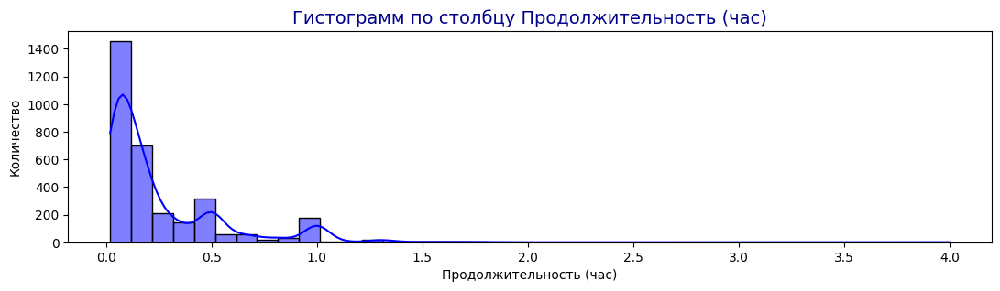

In [ ]:
# Изучим столбец 'Продолжительность (час)' с помощью гистограммы
maker_hist(events['Продолжительность (час)'], n=40)

In [ ]:
# Объявим функцию для создания столбца 'Категория продолжительность (час)'
def segment_time_event(row):
    if row['Продолжительность (час)'] < 0.25:
        return 'до 0.25 часа'
    elif row['Продолжительность (час)'] >= 0.25 and row['Продолжительность (час)'] < 0.5:
        return '0.25-0.50'
    elif row['Продолжительность (час)'] >= 0.5 and row['Продолжительность (час)'] < 1:
        return '0.50-1.00'
    else:
        return 'более 1 часа'
events['Категория продолжительность (час)'] = events.apply(segment_time_event, axis=1)
maker_value_counts(events,'Категория продолжительность (час)')

,count,proportion
Категория продолжительность (час),,
до 0.25 часа,2217,0.69
0.50-1.00,427,0.13
0.25-0.50,360,0.11
более 1 часа,215,0.07


In [ ]:
# Изучим столбец методом unique()
events['Результат'].unique()

array(['Нецелевое использование ЗУ (прил. №3)', 'Отсутствие самостроя',
       'Незаконное размещение объекта (прил. №2)',
       'Частная собственность',
       'Определение площади самовольного строительства',
       'Выявлены нарушения (главы 6 и 9 КоАП г. Москвы)'], dtype=object)

In [ ]:
# Сократим названия для целей визуализации
# Выполним замену со словарем в столбце events['Результат']
# Создадим словарь
d = {
    'Нецелевое использование ЗУ (прил. №3)':'Нецелевое использование',
    'Отсутствие самостроя':'Отсутствие самостроя',
    'Незаконное размещение объекта (прил. №2)':'Незаконное размещение',
    'Частная собственность':'Частная собственность',
    'Определение площади самовольного строительства':'Определение площади самовольного строительства',
    'Выявлены нарушения (главы 6 и 9 КоАП г. Москвы)':'Выявлены нарушения'
}
events['Результат'] = events['Результат'].map(d)
events['Результат'].unique()

array(['Нецелевое использование', 'Отсутствие самостроя',
       'Незаконное размещение', 'Частная собственность',
       'Определение площади самовольного строительства',
       'Выявлены нарушения'], dtype=object)

In [ ]:
# Преодразуем столбец 'Площадь факт. исп., кв.м.' - тип данных int
events['Площадь факт. исп., кв.м.'] = events['Площадь факт. исп., кв.м.'].str.replace(',', '.').str.split('.').str[0]
events['Площадь факт. исп., кв.м.'] = events['Площадь факт. исп., кв.м.'].fillna('0')
events['Площадь факт. исп., кв.м.'] = events['Площадь факт. исп., кв.м.'].astype(int)
events.loc[events['Площадь факт. исп., кв.м.']!=0]['Площадь факт. исп., кв.м.'].describe()

count         706.00
mean       17,251.08
std        86,600.24
min             3.00
25%           255.75
50%         2,250.00
75%         8,730.25
max     1,407,089.00
Name: Площадь факт. исп., кв.м., dtype: float64

In [ ]:
# Объявим функцию для создания столбца 'Категория площадь факт. исп., кв.м.'
def segment_fact_metr(row):
    if row['Площадь факт. исп., кв.м.'] ==0:
        return 'нет данных'
    elif row['Площадь факт. исп., кв.м.'] < 255:
        return 'до 255 кв.м.'
    elif row['Площадь факт. исп., кв.м.'] < 2250:
        return '251-2250 кв.м.'
    elif row['Площадь факт. исп., кв.м.'] < 8700:
        return '2251-8700 кв.м.'
    else:
        return 'более 8701 кв.м.'
events['Категория площадь факт. исп., кв.м.'] = events.apply(segment_fact_metr, axis=1)
maker_value_counts(events,'Категория площадь факт. исп., кв.м.')

,count,proportion
"Категория площадь факт. исп., кв.м.",,
нет данных,2513,0.78
более 8701 кв.м.,178,0.06
до 255 кв.м.,177,0.05
2251-8700 кв.м.,176,0.05
251-2250 кв.м.,175,0.05


In [ ]:
# Изучим столбец events['Площадь объекта'] с помощью метода describe()
events['Площадь объекта'].describe()

count        3,219.00
mean        38,002.82
std        403,323.30
min              0.00
25%            441.00
50%          2,460.00
75%          8,208.50
max     13,824,880.00
Name: Площадь объекта, dtype: float64

In [ ]:
# Объявим функцию для создания категории 'Площадь объекта'
def segment_metr(row):
    if row['Площадь объекта'] ==0:
        return 'нет данных'
    elif row['Площадь объекта'] < 400:
        return 'до 400 кв.м.'
    elif row['Площадь объекта'] < 2450:
        return '401-2450 кв.м.'
    elif row['Площадь объекта'] < 8200:
        return '2451-8200 кв.м.'
    else:
        return 'более 8201 кв.м.'
events['Категория площадь объекта'] = events.apply(segment_metr, axis=1)
maker_value_counts(events,'Категория площадь объекта')

,count,proportion
Категория площадь объекта,,
401-2450 кв.м.,837,0.26
более 8201 кв.м.,809,0.25
2451-8200 кв.м.,803,0.25
до 400 кв.м.,676,0.21
нет данных,94,0.03


In [ ]:
# Изучим столбец events['Право пользования'] с помощью метода unique()
# Создавать укрупненные категории нет смысла, теряется информативность
events['Право пользования'].unique()

array([nan, 'Земельно-правовые отношения не оформлены', 'Аренда',
       'Собственность', 'ЗПО оформлены, договор действует',
       'Без права пользования', 'Постоянное пользование',
       'Безвозмездное пользование',
       'Земельный участок предоставлен на основании решений исполкомов, райсоветов, префектур',
       'Оперативное управление'], dtype=object)

In [ ]:
# Создадим столбец "Период проведения проверки"
events['Период проведения проверки'] = events['Дата проверки/обсл'].dt.to_period('M')
events['Период проведения проверки'].unique()

<PeriodArray>
['2024-03', '2024-02', '2024-01', '2023-12', '2023-11', '2023-10', '2023-09',
 '2023-08', '2023-07', '2023-06', '2023-04', '2023-05', '2023-03', '2023-02',
 '2023-01']
Length: 15, dtype: period[M]

In [ ]:
# Изменим тип данных в столбце events['№ проверки']
events['№ проверки'] = events['№ проверки'].str.split('/').str[0]
events['№ проверки'] = events['№ проверки'].astype(int)

In [ ]:
# Выгрузим датасет events
#events.to_csv('/content/drive/MyDrive/DATA/events.csv', index = False)

#### **1.2.2. EDA**

______________
В этом разделе можно создать различные сводные таблицы.

Сводные таблицы агрегируют данные по интересующему нас признаку.

Визуализации удобнее делать в Datalens.
____________

In [ ]:
# Изучим датасет с помощью метода info()
events.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3219 entries, 0 to 3218
Data columns (total 20 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   Идентификатор мероприятия            3219 non-null   int64         
 1   № проверки                           3219 non-null   int64         
 2   Дата создания карточки               3219 non-null   datetime64[ns]
 3   Вид мероприятия                      3219 non-null   object        
 4   Дата проверки/обсл                   3219 non-null   datetime64[ns]
 5   Продолжительность (час)              3219 non-null   float64       
 6   Результат                            3219 non-null   object        
 7   Наличие нарушения                    3219 non-null   object        
 8   Проверка/обсл. в отношении           3219 non-null   object        
 9   Фактическое использование            3219 non-null   object        
 10  Площадь факт

In [ ]:
# Создадим сводную таблицу: АО - кол-во мероприятий в разрезе результатов проверки
print('Сводная таблица: количество мероприятий в разрезе АО и результатов')
print()
maker_pivot_table(events, 'Округ', 'Результат', 'Идентификатор мероприятия', 'count')

Сводная таблица: количество мероприятий в разрезе АО и результатов



Результат,Выявлены нарушения,Незаконное размещение,Нецелевое использование,Определение площади самовольного строительства,Отсутствие самостроя,Частная собственность,total,%_total
Округ,,,,,,,,
ЦАО,0,355,216,0,69,0,640,20
ЮВАО,0,159,361,0,41,0,561,17
ВАО,0,128,239,2,50,0,419,13
СВАО,1,96,210,0,18,1,326,10
ЮАО,0,40,219,0,16,0,275,9
САО,0,24,188,0,3,0,215,7
ЗАО,0,20,168,0,21,0,209,6
СЗАО,0,42,130,0,13,0,185,6
ЗЕЛАО,0,27,107,0,6,0,140,4


___________
_________
**Промежуточный вывод:**
- самые распространенные нарушения:
   - нецелевое использование;
   - незаконное размещение;
- наибольшее количество мероприятий проводилось в ЦАО и ЮВАО;
- наименьшее количество мероприятий проводилось в МО и ЮЗАО;
____________
____________

In [ ]:
# Создадим сводную таблицу: право пользования - кол-во мероприятий в разрезе результатов проверки
print('Сводная таблица: количество мероприятий в разрезе объектов по праву пользования и результатов')
print()
maker_pivot_table(events, 'Право пользования', 'Результат', 'Идентификатор мероприятия', 'count')

Сводная таблица: количество мероприятий в разрезе объектов по праву пользования и результатов



Результат,Выявлены нарушения,Незаконное размещение,Нецелевое использование,Определение площади самовольного строительства,Отсутствие самостроя,Частная собственность,total,%_total
Право пользования,,,,,,,,
Аренда,1,546,827,0,130,0,1504,60
Земельно-правовые отношения не оформлены,0,95,597,2,44,0,738,29
Постоянное пользование,0,10,116,0,5,0,131,5
Безвозмездное пользование,0,0,37,0,4,0,41,2
"ЗПО оформлены, договор действует",0,19,17,0,1,0,37,1
Собственность,0,3,6,0,16,1,26,1
Без права пользования,0,2,14,0,0,0,16,1
Оперативное управление,0,0,9,0,0,0,9,0
"Земельный участок предоставлен на основании решений исполкомов, райсоветов, префектур",0,0,1,0,3,0,4,0


___________
_________
**Промежуточный вывод:**

-лидеры по количеству нарушений:
  - арендованные объекты;
  - объекты с неоформленными земельно-правовыми отношениями.
____________
____________

In [ ]:
# Создадим сводную таблицу: период проверки - кол-во мероприятий в разрезе результатов проверки
print('Сводная таблица: количество мероприятий в разрезе периодов проведения и результатов')
print()
maker_pivot_table(events, 'Период проведения проверки', 'Результат', 'Идентификатор мероприятия', 'count')

Сводная таблица: количество мероприятий в разрезе периодов проведения и результатов



Результат,Выявлены нарушения,Незаконное размещение,Нецелевое использование,Определение площади самовольного строительства,Отсутствие самостроя,Частная собственность,total,%_total
Период проведения проверки,,,,,,,,
2023-03,0,91,207,0,15,0,313,10
2023-04,0,59,193,0,21,0,273,8
2024-02,0,88,152,0,30,0,270,8
2023-10,0,86,161,1,21,0,269,8
2023-12,0,69,159,0,24,1,253,8
2023-11,0,114,123,0,11,0,248,8
2023-07,0,35,184,0,11,0,230,7
2023-05,0,45,168,0,8,0,221,7
2023-06,1,56,144,0,12,0,213,7


____________
_____________
**Промежуточный вывод:**
- наибольшее количество мероприятий за период 2023-2024 гг было проведено в марте 2023 г.;
- наименьшее количество мероприятий за период 2023-2024 гг было проведено в феврале 2023 г.;
____________
___________

In [ ]:
# Создадим сводную таблицу: АО - кол-во мероприятий в разрезе продолжительности проверки
print('Сводная таблица: количество мероприятий в разрезе АО и продолжительности проверки в часах')
print()
maker_pivot_table(events, 'Округ', 'Категория продолжительность (час)', 'Идентификатор мероприятия', 'count')

Сводная таблица: количество мероприятий в разрезе АО и продолжительности проверки в часах



Категория продолжительность (час),0.25-0.50,0.50-1.00,более 1 часа,до 0.25 часа,total,%_total
Округ,,,,,,
ЦАО,23,83,27,507,640,20
ЮВАО,64,20,2,475,561,17
ВАО,86,67,23,243,419,13
СВАО,19,187,118,2,326,10
ЮАО,49,9,3,214,275,9
САО,23,19,9,164,215,7
ЗАО,19,2,1,187,209,6
СЗАО,32,28,13,112,185,6
ЗЕЛАО,16,5,2,117,140,4


_____________
___________
**Промежуточный вывод:**
- самая больша продолжительность мероприятий в СВАО - от 30 минут и более;
- в других АО продолжительность мероприятий обычно составляет до 15 минут.
_________________
_____________

In [ ]:
# Создадим сводную таблицу: АО - кол-во мероприятий в разрезе категории площади объекта
print('Сводная таблица: количество мероприятий в разрезе АО и площади объекта')
print()
maker_pivot_table(events, 'Округ', 'Категория площадь объекта', 'Идентификатор мероприятия', 'count')

Сводная таблица: количество мероприятий в разрезе АО и площади объекта



Категория площадь объекта,2451-8200 кв.м.,401-2450 кв.м.,более 8201 кв.м.,до 400 кв.м.,нет данных,total,%_total
Округ,,,,,,,
ЦАО,138,274,37,162,29,640,20
ЮВАО,135,145,138,122,21,561,17
ВАО,98,115,129,77,0,419,13
СВАО,112,69,101,37,7,326,10
ЮАО,81,58,99,37,0,275,9
САО,62,36,64,53,0,215,7
ЗАО,38,41,45,77,8,209,6
СЗАО,44,33,79,29,0,185,6
ЗЕЛАО,67,13,52,6,2,140,4


______________
___________
**Промежуточный вывод:**
- мероприятия на крупных объектах площадью более 2500 кв.м. чаще всего проводятся в ЦАО, ВАО и СВАО;
- в ЦАО преобладают объекты общей площадью до 2450 кв.м.
____________
___________

In [ ]:
# Создадим сводную таблицу: АО - кол-во мероприятий в разрезе видов мероприятий
print('Сводная таблица: количество мероприятий в разрезе АО и видов мероприятий')
print()
maker_pivot_table(events, 'Округ', 'Вид мероприятия', 'Идентификатор мероприятия', 'count')

Сводная таблица: количество мероприятий в разрезе АО и видов мероприятий



Вид мероприятия,Выездное обследование,Функциональное мероприятие,total,%_total
Округ,,,,
ЦАО,572,68,640,20
ЮВАО,505,56,561,17
ВАО,326,93,419,13
СВАО,259,67,326,10
ЮАО,228,47,275,9
САО,178,37,215,7
ЗАО,176,33,209,6
СЗАО,156,29,185,6
ЗЕЛАО,132,8,140,4


______________
___________
**Промежуточный вывод:**
- выездных мероприятий в разы больше, чем функциональных.
____________
___________

In [ ]:
# Создадим сводную таблицу: АО - кол-во мероприятий в разрезе наличия нарушений
violations = (events.pivot_table(index = 'Округ',
                                     columns = 'Наличие нарушения',
                                     values = 'Идентификатор мероприятия',
                                     aggfunc = 'count'))
violations = violations.fillna(0)
violations.columns = ['нарушения есть', 'нарушений нет']
violations['%_нарушений'] = (violations['нарушения есть']/(violations['нарушения есть']+violations['нарушений нет']))*100
violations.astype(int).sort_values(by='%_нарушений', ascending=False).style.background_gradient(cmap='GnBu', axis=0)


,нарушения есть,нарушений нет,%_нарушений
Округ,,,
ЦАО,558,82,87
ЗЕЛАО,119,21,85
ЮВАО,464,97,82
СЗАО,148,37,80
ЗАО,159,50,76
ВАО,305,114,72
САО,156,59,72
СВАО,231,95,70
ЮЗАО,38,16,70


______________
___________
**Промежуточный вывод:**
- наибольщий удельный вес нарушений приходится на ЦАО и ЗЕЛАО;
- наимельший - на НАО и МО.
____________
___________

In [ ]:
# Создадим сводную таблицу: Фактическое использование - кол-во мероприятий в разрезе наличия нарушений
violations2 = (events.pivot_table(index = 'Фактическое использование',
                                     columns = 'Наличие нарушения',
                                     values = 'Идентификатор мероприятия',
                                     aggfunc = 'count'))
violations2 = violations2.fillna(0)
violations2.columns = ['нарушения есть', 'нарушений нет']
violations2['%_нарушений'] = (violations2['нарушения есть']/(violations2['нарушения есть']+violations2['нарушений нет']))*100
violations2.sort_values(by='нарушения есть', ascending=False).head(10).style.background_gradient(cmap='GnBu', axis=0)

,нарушения есть,нарушений нет,%_нарушений
Фактическое использование,,,
прочее,1388.000000,339.000000,80.370585
"база, склад",171.000000,32.000000,84.236453
"Офисы, административные цели",122.000000,25.000000,82.993197
"стационарный магазин, торговый комплекс",84.000000,16.000000,84.000000
вид деятельности не выяснен,81.000000,29.000000,73.636364
деятельность не ведется,58.000000,29.000000,66.666667
автосервис,53.000000,4.000000,92.982456
"индивидуальный гараж, гаражный кооператив",31.000000,11.000000,73.809524
индивидуальный жилой дом,28.000000,11.000000,71.794872


### **1.3. Загрузим третий лист файла - objects**

#### **1.3.1. Загрузка  и первичное знакомство с данными**

In [ ]:
# Загрузим файл и создадим датасет
objects = pd.read_excel(url, header=1, sheet_name='Объекты')
objects.head()

,№ п/п,Идентификатор объекта,Название объекта,Дата создания карточки объекта,Основание выявления/первого обследования,Вид мероприятия,Округ,Район,Тип объекта,Площадь/длина самостроя,Единицы измерения площади/длины,Площадь объекта,Приложение 819-ПП,Состояние,Количество объектов,Рассматривается в рамках,Дата выявления,Стадия строительства (из последнего КИМ),Демонтирован,Дата демонтажа,Плановая дата демонтажа,Измененная дата демонтажа,Отложенный демонтаж,Фактическое использование,"Лицо, осуществившее демонтаж",ЗПО,Разр. на стр.,ЕГРП,ID первого КИМ,№ первого КИМ,Дата первого КИМ,Дата акта первого КИМ,Результат первого КИМ,Состояние верификации первого КИМ,ID последнего КИМ,№ последнего КИМ,Дата последнего КИМ,Дата акта последнего КИМ,Результат последнего КИМ,Состояние верификации последнего КИМ
0,1,58817,Объект 1,2024-03-12 17:19:37,Обследование не проводилось. Выявлен ГИН,NaN,Юго-Восточный,Печатники,прочее,"1,391.00",кв. м,"1,391.00",приложение 3,Учтен,3,819-ПП,NaT,NaN,Нет,NaT,2024-04-12,2024-04-12,Нет,прочее,NaN,Имеются,Не имеются,Не имеются,1147581,9048253,2024-03-12,2024-03-12,Нецелевое использование ЗУ (прил. №3),Верифицировано,1147581,9048253,2024-03-12,2024-03-12,Нецелевое использование ЗУ (прил. №3),Верифицировано
1,2,58805,Объект 2,2024-03-12 11:59:21,Поручения руководителя,Выездное обследование,Юго-Восточный,Люблино,пристройка,78.50,кв. м,78.50,приложение 3,Учтен,5,819-ПП,2024-03-11,Нет,Нет,NaT,2024-04-11,2024-04-11,Нет,прочее,NaN,Имеются,Не имеются,Не имеются,1147542,9048265,2024-03-11,2024-03-11,Нецелевое использование ЗУ (прил. №3),Верифицировано,1147542,9048265,2024-03-11,2024-03-11,Нецелевое использование ЗУ (прил. №3),Верифицировано
2,9,58775,Объект 3,2024-03-07 09:18:15,Поручения руководителя,Выездное обследование,Восточный,Богородское,пристройка,35.60,кв. м,35.60,приложение 3,Учтен,1,819-ПП,2024-03-05,Нет,Нет,NaT,2024-04-05,2024-04-05,Нет,прочее,NaN,Имеются,Не имеются,Не имеются,1147185,9038344,2024-03-05,2024-03-05,Нецелевое использование ЗУ (прил. №3),Верифицировано,1147185,9038344,2024-03-05,2024-03-05,Нецелевое использование ЗУ (прил. №3),Верифицировано
3,11,58772,Объект 4,2024-03-06 19:36:21,Поручения руководителя,Функциональное мероприятие,Восточный,Метрогородок,прочее,190.00,кв. м,190.00,приложение 3,Учтен,3,819-ПП,2024-03-06,Нет,Да,2024-03-07,NaT,NaT,Нет,прочее,NaN,Имеются,Не имеются,Не имеются,1147681,9038383,2024-03-07,2024-03-07,Демонтаж подтвержден,Верифицировано,1147681,9038383,2024-03-07,2024-03-07,Демонтаж подтвержден,Верифицировано
4,14,58764,Объект 5,2024-03-06 12:33:07,Поручения руководителя,Функциональное мероприятие,Юго-Восточный,Печатники,пристройка,64.00,кв. м,64.00,приложение 3,Учтен,1,819-ПП,2024-03-06,Нет,Нет,NaT,2024-04-08,2025-06-30,Да,"спортивный комплекс (дворец спорта, стадион, в...",NaN,Имеются,Не имеются,Не имеются,1146997,9048249,2024-03-06,2024-03-06,Нецелевое использование ЗУ (прил. №3),Верифицировано,1146997,9048249,2024-03-06,2024-03-06,Нецелевое использование ЗУ (прил. №3),Верифицировано


In [ ]:
# Изучим датасет с помощью метода info()
objects.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2937 entries, 0 to 2936
Data columns (total 40 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   № п/п                                     2937 non-null   int64         
 1   Идентификатор объекта                     2937 non-null   int64         
 2   Название объекта                          2937 non-null   object        
 3   Дата создания карточки объекта            2937 non-null   datetime64[ns]
 4   Основание выявления/первого обследования  2937 non-null   object        
 5   Вид мероприятия                           2737 non-null   object        
 6   Округ                                     2937 non-null   object        
 7   Район                                     2937 non-null   object        
 8   Тип объекта                               2937 non-null   object        
 9   Площадь/длина самостроя       

In [ ]:
# Сформируем отчет pandas profiling
profile2 = ProfileReport(objects, title="Pandas Profiling Report")
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

___________________
_____________
**Промежуточный вывод:**
- с исходном датасете 40 столбцов и 2937 строк;
- полных дубликатов нет;
- пропуски в 7 столбцах:
  - Приложение 819-ПП;
  - Дата выявления;
  - Стадия строительства (из последнего КИМ);
  - Дата демонтажа;
  - Плановая дата демонтажа;
  - Измененная дата демонтажа;
  - Лицо, осуществившее демонтаж;
- название столбцов не соответствует стандарту.

Столбцы - кандидаты на удаление из датасета:
- № п/п;
- Название объекта;
- Приложение 819-ПП;
- Рассматривается в рамках;
- Плановая дата демонтажа;
- Измененная дата демонтажа;
- ID первого КИМ;
- № первого КИМ;
- Дата первого КИМ;
- Результат первого КИМ;
- Состояние верификации первого КИМ;
- ID последнего КИМ;
- № последнего КИМ;
- № последнего КИМ;
- Результат последнего КИМ;
- Состояние верификации последнего КИМ.

Часть столбцов для целей визуализации возможно потребуется изменить - разделить на категории и объединить редковстречающиеся признаки в категорию "Прочие":
  - Основание выявления/первого обследования;
  - Тип объекта;
  - Площадь/длина самостроя;
  - Площадь объекта;
  - Состояние;
  - Количество объектов.

Удалим 18 столбцов из 40.

Проанализируем 6 столбцов на предмет категоризации.
_______________
_____________

In [ ]:
# Удалим выбранные выше столбцы
objects = objects[['Идентификатор объекта',
       'Дата создания карточки объекта',
       'Основание выявления/первого обследования', 'Вид мероприятия', 'Округ',
       'Район', 'Тип объекта', 'Площадь/длина самостроя',
       'Единицы измерения площади/длины', 'Площадь объекта',
       'Состояние', 'Количество объектов',
       'Дата выявления',
       'Стадия строительства (из последнего КИМ)', 'Демонтирован',
       'Дата демонтажа', 'Отложенный демонтаж',
       'Фактическое использование', 'Лицо, осуществившее демонтаж', 'ЗПО',
       'Разр. на стр.', 'ЕГРП']]

In [ ]:
# Изучим столбец objects['Основание выявления/первого обследования']
# Оставим без изменений
objects['Основание выявления/первого обследования'].value_counts()

Основание выявления/первого обследования
Поручения руководителя                      1935
Обращения ОИВ (Правительство г.Москвы)       468
Обследование не проводилось. Выявлен ГИН     159
Инициативно                                  142
Камеральные проверки                          61
Тематические проверки                         47
Обследование не проводилось. Выявлен ОИВ      41
Обращения граждан (ЭДО)                       32
Инструментальный мониторинг                   25
Обращения граждан (Портал "Наш город")         7
Обращения юридических лиц                      6
Обращение                                      5
Обращения ОИВ (Правительство РФ)               3
Мониторинг                                     3
Поручение                                      2
Решение ГЗК                                    1
Name: count, dtype: int64

In [ ]:
# Изучим столбец objects['Тип объекта']
# Оставим без изменений
objects['Тип объекта'].value_counts()

Тип объекта
прочее                1075
пристройка             552
строение               541
здание                 322
надстройка             210
отдельное строение     135
мансарда                47
гараж                   21
ангар                   18
ГСК                      6
забор                    5
павильон                 5
Name: count, dtype: int64

count    2,937.00
mean       490.48
std      1,872.14
min          0.00
25%         36.50
50%        114.00
75%        357.50
max     54,279.70
Name: Площадь/длина самостроя, dtype: float64

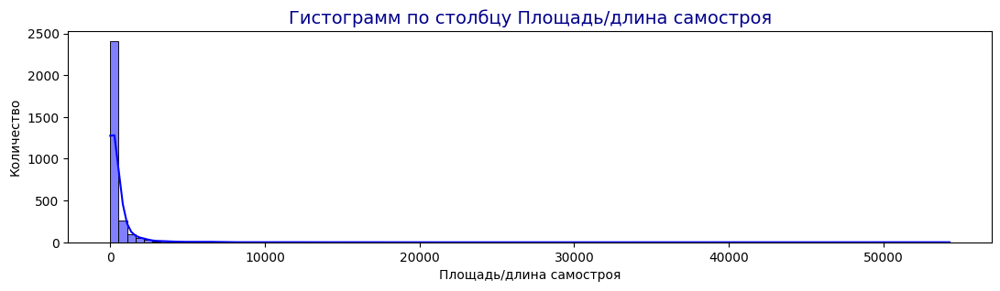

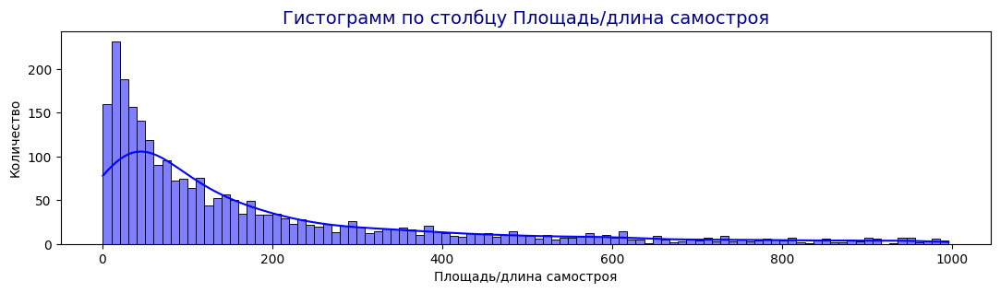

In [ ]:
# Изучим столбец objects['Площадь/длина самостроя']
# Создадим столбец с категорией по площади/длине самотроя
display(objects['Площадь/длина самостроя'].describe())
maker_hist(objects['Площадь/длина самостроя'], n=100)
maker_hist(objects.loc[(objects['Площадь/длина самостроя']!=0)&(objects['Площадь/длина самостроя']<1000), 'Площадь/длина самостроя'], n=100)

In [ ]:
# Объявим функцию для создания столбца 'Категория площади/длины самостроя'
def segment_area(row):
    if row['Площадь/длина самостроя'] < 40:
        return 'до 39 кв.м.'
    elif row['Площадь/длина самостроя'] >= 40 and row['Площадь/длина самостроя'] < 115:
        return '50-114 кв.м.'
    elif row['Площадь/длина самостроя'] >= 115 and row['Площадь/длина самостроя'] < 350:
        return '115-349 кв.м.'
    elif row['Площадь/длина самостроя'] >= 350 and row['Площадь/длина самостроя'] < 1000:
        return '350-999 кв.м.'
    else:
        return 'более 1000 кв.м.'
objects['Категория площади/длины самостроя'] = objects.apply(segment_area, axis=1)
maker_value_counts(objects,'Категория площади/длины самостроя')

,count,proportion
Категория площади/длины самостроя,,
до 39 кв.м.,765,0.26
115-349 кв.м.,717,0.24
50-114 кв.м.,710,0.24
350-999 кв.м.,454,0.15
более 1000 кв.м.,291,0.10


count     2,937.00
mean      1,338.23
std       4,487.23
min           0.00
25%          54.00
50%         200.00
75%         907.20
max     115,010.30
Name: Площадь объекта, dtype: float64

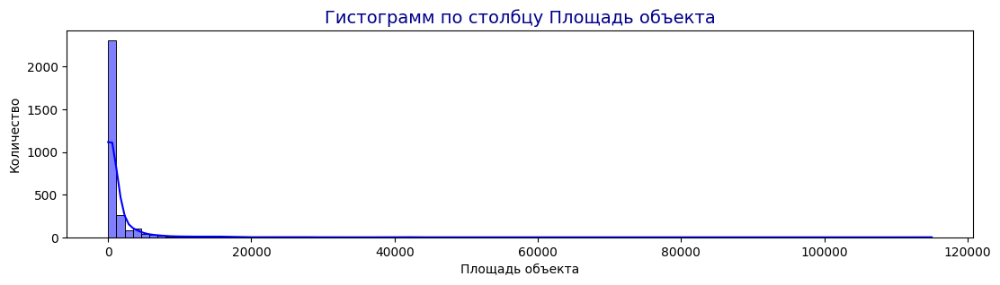

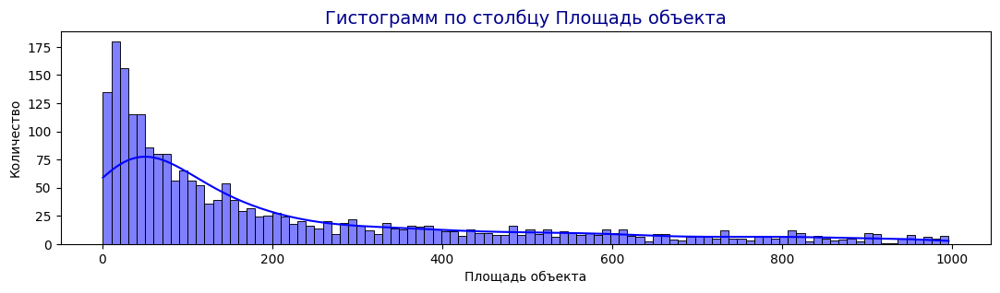

In [ ]:
# Изучим столбец objects['Площадь объекта']
# Создадим столбец с категорией по площади объекта
display(objects['Площадь объекта'].describe())
maker_hist(objects['Площадь объекта'], n=100)
maker_hist(objects.loc[(objects['Площадь объекта']!=0)&(objects['Площадь объекта']<1000), 'Площадь объекта'], n=100)

In [ ]:
# Объявим функцию для создания столбца 'Категория площади объекта'
def segment_area2(row):
    if row['Площадь объекта'] < 100:
        return 'до 99 кв.м.'
    elif row['Площадь объекта'] >= 100 and row['Площадь объекта'] < 200:
        return '100-199 кв.м.'
    elif row['Площадь объекта'] >= 200 and row['Площадь объекта'] < 900:
        return '200-899 кв.м.'
    elif row['Площадь объекта'] >= 900 and row['Площадь объекта'] < 10000:
        return '900-10000 кв.м.'
    else:
        return 'более 10000 кв.м.'
objects['Категория площади объекта'] = objects.apply(segment_area2, axis=1)
maker_value_counts(objects,'Категория площади объекта')

,count,proportion
Категория площади объекта,,
до 99 кв.м.,1077,0.37
200-899 кв.м.,726,0.25
900-10000 кв.м.,667,0.23
100-199 кв.м.,391,0.13
более 10000 кв.м.,76,0.03


In [ ]:
# Изучим столбец objects['Состояние']
# Оставим без изменений
objects['Состояние'].value_counts()

Состояние
Учтен                          1867
Включен                         664
Признаки СС не подтверждены     164
Согласован для включения         90
Не предмет                       74
Исключен                         29
Признаки СС подтверждены         26
Сохранен                         10
Принято решение ГЗК              10
Обладает признаками СС            2
Согласован для исключения         1
Name: count, dtype: int64

count    2,937.00
mean         7.61
std        221.57
min          1.00
25%          1.00
50%          1.00
75%          3.00
max     12,001.00
Name: Количество объектов, dtype: float64

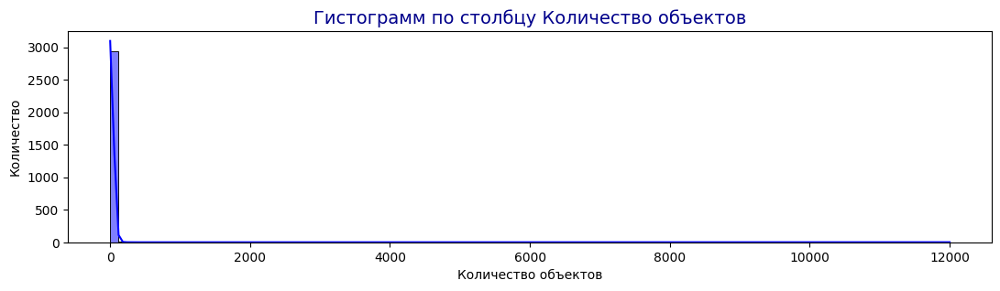

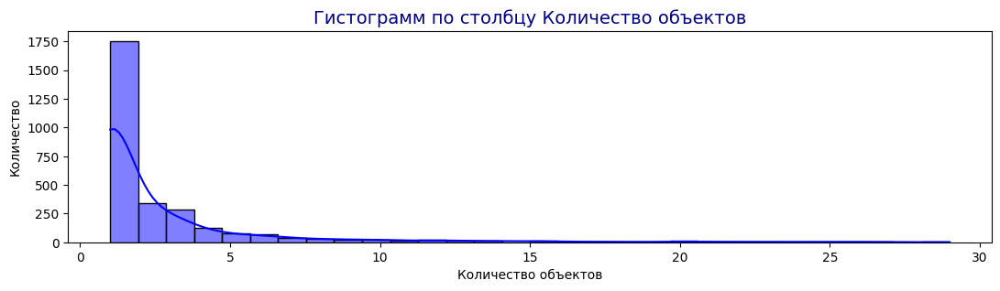

In [ ]:
# Изучим столбец objects['Количество объектов']
# Создадим столбец с категорией по количеству объектов
display(objects['Количество объектов'].describe())
maker_hist(objects['Количество объектов'], n=100)
maker_hist(objects.loc[(objects['Количество объектов']!=0)&(objects['Количество объектов']<30), 'Количество объектов'], n=30)

In [ ]:
# Объявим функцию для создания столбца 'Категория по количеству объектов'
def segment_count_objects(row):
    if row['Количество объектов'] == 1:
        return '1 объект'
    elif row['Количество объектов'] >= 2 and row['Количество объектов'] < 6:
        return '2-5 объектов'
    elif row['Количество объектов'] >= 6 and row['Количество объектов'] < 25:
        return '6-24 объектов'
    else:
        return 'более 25 объектов'
objects['Категория по количеству объектов'] = objects.apply(segment_count_objects, axis=1)
maker_value_counts(objects,'Категория по количеству объектов')

,count,proportion
Категория по количеству объектов,,
1 объект,1755,0.60
2-5 объектов,828,0.28
6-24 объектов,294,0.10
более 25 объектов,60,0.02


In [ ]:
# Создадим столбец "Год создания карточки объекта"
objects['Год создания карточки объекта'] = objects['Дата создания карточки объекта'].dt.year
objects['Год создания карточки объекта'].unique()

array([2024, 2023, 2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014],
      dtype=int32)

In [ ]:
# Создадим столбец "Год демонтажа"
objects['Год демонтажа'] = objects['Дата демонтажа'].dt.year
objects['Год демонтажа'] = objects['Год демонтажа'].fillna(0).astype(int)
objects['Год демонтажа'].unique()

array([   0, 2024, 2023, 2017, 2019])

In [ ]:
d = (
    {'Юго-Восточный':'ЮВАО',
     'Восточный':'ВАО',
     'Северный':'САО',
     'Западный':'ЗАО',
     'Южный':'ЮАО',
     'Северо-Восточный':'СВАО',
     'Северо-Западный':'СЗАО',
     'Новомосковский':'НАО',
     'Троицкий':'ТАО',
     'Зеленоград':'ЗЕЛАО',
     'Центральный':'ЦАО',
     'Московская область':'МО',
     'Юго-Западный':'ЮЗАО'}
       )
objects['Округ'] = objects['Округ'].map(d)

In [ ]:
# Выгрузим датасет objects
#objects.to_csv('/content/drive/MyDrive/DATA/objects.csv', index = False)

#### **1.3.2. EDA**

In [ ]:
# Изучим датасет с помощью метода info()
objects.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2937 entries, 0 to 2936
Data columns (total 27 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   Идентификатор объекта                     2937 non-null   int64         
 1   Дата создания карточки объекта            2937 non-null   datetime64[ns]
 2   Основание выявления/первого обследования  2937 non-null   object        
 3   Вид мероприятия                           2737 non-null   object        
 4   Округ                                     2937 non-null   object        
 5   Район                                     2937 non-null   object        
 6   Тип объекта                               2937 non-null   object        
 7   Площадь/длина самостроя                   2937 non-null   float64       
 8   Единицы измерения площади/длины           2937 non-null   object        
 9   Площадь объекта               

In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе типа объекта
print('Сводная таблица: количество объектов в разрезе АО и типов объектов')
print()
maker_pivot_table(objects, 'Округ', 'Тип объекта', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и типов объектов



Тип объекта,ГСК,ангар,гараж,забор,здание,мансарда,надстройка,отдельное строение,павильон,пристройка,прочее,строение,total,%_total
Округ,,,,,,,,,,,,,,
ЦАО,0,4,0,0,39,29,100,8,0,114,244,27,565,19
ЮВАО,0,1,2,0,75,4,21,57,1,117,134,107,519,18
ВАО,1,1,2,2,44,7,32,9,1,88,117,81,385,13
СВАО,0,0,0,1,38,0,9,7,0,52,182,20,309,11
ЮАО,0,5,1,0,20,2,17,15,0,42,126,41,269,9
САО,0,1,3,0,9,2,5,1,0,28,97,61,207,7
ЗАО,1,1,6,1,20,0,6,18,0,33,50,61,197,7
СЗАО,0,2,3,0,19,1,10,6,1,25,45,50,162,6
ЗЕЛАО,0,0,1,0,8,0,4,1,0,26,30,30,100,3


___________
___________
**Промежуточный итог:**

- лидеры по количеству объектов ЦАО и ЮВАО;
- минимальное количество объектов в ЮЗАО и МО;
- из индифицированных типов объектов самые многочисленные: пристройки и надстройки.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе года создания карточки объекта
print('Сводная таблица: количество объектов в разрезе АО и года создания карточки объекта')
print()
maker_pivot_table(objects, 'Округ', 'Год создания карточки объекта', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и года создания карточки объекта



Год создания карточки объекта,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,total,%_total
Округ,,,,,,,,,,,,,
ЦАО,2,0,0,1,1,0,1,2,15,432,111,565,19
ЮВАО,1,2,2,2,2,6,22,1,13,438,30,519,18
ВАО,2,0,2,2,1,0,0,1,20,308,49,385,13
СВАО,1,3,2,4,2,4,2,1,15,236,39,309,11
ЮАО,1,0,0,0,3,0,0,0,11,211,43,269,9
САО,0,0,0,0,0,1,0,0,6,181,19,207,7
ЗАО,1,0,1,2,1,1,0,1,4,167,19,197,7
СЗАО,1,1,0,0,1,1,0,0,9,132,17,162,6
ЗЕЛАО,0,0,0,0,0,0,0,0,0,94,6,100,3


___________
___________
**Промежуточный итог:**

Судя по датам создания карточек объектов активность АНА ЦР "Среда возможностей резко возрасла в 2023 г.

До 2024 г. деятельность не распространялась на МО.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе года основание выявления/первого обследования
print('Сводная таблица: количество объектов в разрезе АО и основание выявления/первого обследования')
print()
maker_pivot_table(objects, 'Округ', 'Основание выявления/первого обследования', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и основание выявления/первого обследования



Основание выявления/первого обследования,Инициативно,Инструментальный мониторинг,Камеральные проверки,Мониторинг,Обращение,Обращения ОИВ (Правительство РФ),Обращения ОИВ (Правительство г.Москвы),"Обращения граждан (Портал ""Наш город"")",Обращения граждан (ЭДО),Обращения юридических лиц,Обследование не проводилось. Выявлен ГИН,Обследование не проводилось. Выявлен ОИВ,Поручение,Поручения руководителя,Решение ГЗК,Тематические проверки,total,%_total
Округ,,,,,,,,,,,,,,,,,,
ЦАО,2,2,5,0,2,0,129,0,1,0,16,0,0,407,0,1,565,19
ЮВАО,5,12,2,0,0,0,26,1,1,0,26,38,0,407,1,0,519,18
ВАО,14,0,6,0,0,0,66,2,3,0,51,0,0,243,0,0,385,13
СВАО,3,0,1,1,0,0,43,1,9,4,0,0,1,246,0,0,309,11
ЮАО,0,0,16,2,0,0,9,0,2,0,0,0,0,240,0,0,269,9
САО,14,0,2,0,0,1,30,0,7,0,5,0,0,148,0,0,207,7
ЗАО,79,3,2,0,2,1,95,0,0,2,5,3,1,3,0,1,197,7
СЗАО,8,0,0,0,1,0,21,2,0,0,28,0,0,102,0,0,162,6
ЗЕЛАО,4,0,0,0,0,0,8,0,1,0,0,0,0,44,0,43,100,3


___________
___________
**Промежуточный итог:**

Наиболее часто встречающееся основание для первого обследования является поручение руководителя и обращение ОИВ.

Встает вопрос: незначительное количество обследованных объектов в отдельных АО - это отсутствие таковых объектов или низная активность руководителей.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе вида мероприятия
print('Сводная таблица: количество объектов в разрезе АО и вида мероприятия')
print()
maker_pivot_table(objects, 'Округ', 'Вид мероприятия', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и вида мероприятия



Вид мероприятия,Выездное обследование,Осмотр ОНФ,Функциональное мероприятие,total,%_total
Округ,,,,,
ЦАО,297,48,204,549,20
ЮВАО,178,19,258,455,17
ВАО,129,15,190,334,12
СВАО,101,10,198,309,11
ЮАО,66,3,200,269,10
САО,39,2,161,202,7
ЗАО,57,2,130,189,7
СЗАО,66,0,68,134,5
ЗЕЛАО,33,3,64,100,4


___________
___________
**Промежуточный итог:**

Чем больше в АО объектов, тем чаще изпользуются выездные проверки.

Чем меньше объектов в АО, тем больше функциональных мероприятий.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: кол-во объектов в разрезе типов объектов и видов мероприятий
print('Сводная таблица: количество объектов в разрезе типов объектов и видов мероприятий')
print()
maker_pivot_table(objects, 'Тип объекта', 'Вид мероприятия', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе типов объектов и видов мероприятий



Вид мероприятия,Выездное обследование,Осмотр ОНФ,Функциональное мероприятие,total,%_total
Тип объекта,,,,,
прочее,367,37,599,1003,37
пристройка,194,31,286,511,19
строение,108,0,387,495,18
здание,188,23,89,300,11
надстройка,116,11,77,204,7
отдельное строение,25,0,104,129,5
мансарда,29,2,11,42,2
гараж,6,1,12,19,1
ангар,7,0,11,18,1


___________
___________
**Промежуточный итог:**

По строениям и пристройкам проводят значительное количество функциональных мероприятий.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе состояния
print('Сводная таблица: количество объектов в разрезе АО и состояния')
print()
maker_pivot_table(objects, 'Округ', 'Состояние', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и состояния



Состояние,Включен,Исключен,Не предмет,Обладает признаками СС,Признаки СС не подтверждены,Признаки СС подтверждены,Принято решение ГЗК,Согласован для включения,Согласован для исключения,Сохранен,Учтен,total,%_total
Округ,,,,,,,,,,,,,
ЦАО,216,9,12,0,58,6,3,53,1,2,205,565,19
ЮВАО,129,2,6,0,35,4,2,6,0,2,333,519,18
ВАО,104,7,11,1,30,4,2,3,0,3,220,385,13
СВАО,81,1,2,1,14,1,1,6,0,2,200,309,11
ЮАО,31,5,9,0,5,0,0,3,0,0,216,269,9
САО,20,1,1,0,2,1,0,1,0,0,181,207,7
ЗАО,14,3,12,0,7,3,0,2,0,1,155,197,7
СЗАО,29,1,5,0,7,1,0,4,0,0,115,162,6
ЗЕЛАО,19,0,6,0,0,1,0,0,0,0,74,100,3


In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе стадии строительства
print('Сводная таблица: количество объектов в разрезе АО и стадии строительства')
print()
maker_pivot_table(objects, 'Округ', 'Стадия строительства (из последнего КИМ)', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и стадии строительства



Стадия строительства (из последнего КИМ),Ведется строительство,"Не пресечено, программа ""Сохранение""",Нет,"Пресечено, объект демонтирован","Пресечено, получена разрешительная документация","Пресечено, строительные работы приостановлены",total,%_total
Округ,,,,,,,,
ЦАО,3,0,546,0,0,0,549,20
ЮВАО,0,0,453,0,0,2,455,17
ВАО,3,0,331,0,0,0,334,12
СВАО,3,0,302,2,0,2,309,11
ЮАО,0,0,264,2,2,1,269,10
САО,2,1,197,2,0,0,202,7
ЗАО,0,0,189,0,0,0,189,7
СЗАО,2,1,129,2,0,0,134,5
ЗЕЛАО,1,0,95,3,1,0,100,4


In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе стадии демонтажа
print('Сводная таблица: количество объектов в разрезе АО и стадии демонтажа')
print()
maker_pivot_table(objects, 'Округ', 'Демонтирован', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и стадии демонтажа



Демонтирован,Да,Нет,total,%_total
Округ,,,,
ЦАО,133,432,565,19
ЮВАО,229,290,519,18
ВАО,153,232,385,13
СВАО,131,178,309,11
ЮАО,155,114,269,9
САО,125,82,207,7
ЗАО,115,82,197,7
СЗАО,66,96,162,6
ЗЕЛАО,59,41,100,3


___________
___________
**Промежуточный итог:**

Низкий процент демонтажа в ЦАО, хотелось бы знать причину.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: кол-во объектов в разрезе типа объекта и стадии демонтажа
print('Сводная таблица: количество объектов в разрезе типа объекта и стадии демонтажа')
print()
maker_pivot_table(objects, 'Тип объекта', 'Демонтирован', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе типа объекта и стадии демонтажа



Демонтирован,Да,Нет,total,%_total
Тип объекта,,,,
прочее,494,581,1075,37
пристройка,205,347,552,19
строение,367,174,541,18
здание,39,283,322,11
надстройка,43,167,210,7
отдельное строение,98,37,135,5
мансарда,2,45,47,2
гараж,14,7,21,1
ангар,9,9,18,1


___________
___________
**Промежуточный итог:**

Наибольшее количество демонтированных объектов среди строений и наражей.

Пристройки и мансарды демонтируют реже.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе года демонтажа
print('Сводная таблица: количество объектов в разрезе АО и года демонтажа')
print()
maker_pivot_table(objects, 'Округ', 'Год демонтажа', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и года демонтажа



Год демонтажа,0,2017,2019,2023,2024,total,%_total
Округ,,,,,,,
ЦАО,432,0,0,109,24,565,19
ЮВАО,290,0,0,193,36,519,18
ВАО,232,1,1,127,24,385,13
СВАО,178,0,0,112,19,309,11
ЮАО,114,0,0,137,18,269,9
САО,82,0,0,110,15,207,7
ЗАО,82,0,0,104,11,197,7
СЗАО,96,0,0,54,12,162,6
ЗЕЛАО,41,0,0,55,4,100,3


___________
___________
**Промежуточный итог:**

Наибольшее количество демонтажей пришлось на 2023 г., начало 2024 г. также имеет хорошие результаты по демонтажу.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе отложенного демонтажа
print('Сводная таблица: количество объектов в разрезе АО и отложенного демонтажа')
print()
maker_pivot_table(objects, 'Округ', 'Отложенный демонтаж', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и отложенного демонтажа



Отложенный демонтаж,Да,Не указано,Нет,total,%_total
Округ,,,,,
ЦАО,25,1,539,565,19
ЮВАО,66,0,453,519,18
ВАО,40,0,345,385,13
СВАО,53,0,256,309,11
ЮАО,41,0,228,269,9
САО,33,0,174,207,7
ЗАО,26,1,170,197,7
СЗАО,39,0,123,162,6
ЗЕЛАО,8,0,92,100,3


___________
___________
**Промежуточный итог:**

Лидеры по отложенномудемонтажу ЮВАО и СВАО. Интересна причина.
_____________
_____________

In [ ]:
# Создадим сводную таблицу: АО - кол-во объектов в разрезе лица, осуществившего демонтаж
print('Сводная таблица: количество объектов в разрезе АО и лица, осуществившего демонтаж')
print()
maker_pivot_table(objects, 'Округ', 'Лицо, осуществившее демонтаж', 'Идентификатор объекта', 'count')

Сводная таблица: количество объектов в разрезе АО и лица, осуществившего демонтаж



"Лицо, осуществившее демонтаж",ГБУ,Собственник,total,%_total
Округ,,,,
ЮВАО,73,151,224,18
ЮАО,38,110,148,12
ВАО,51,93,144,12
СВАО,62,62,124,10
САО,38,83,121,10
ЦАО,43,74,117,10
ЗАО,76,37,113,9
СЗАО,23,41,64,5
ЗЕЛАО,30,28,58,5


___________
___________
**Промежуточный итог:**

В большенсте АО демонтаж проводит собственник.

В Зеленограде и ЗАО демонтаж чаше проводится силами ГБУ.
_____________
_____________

### **1.4. Создадим сводный файл на основе датасетов: tasks, events, objects**

_________________
**Правила объединения (согласно ТЗ):**

- задача (tasks) может быть связана с несколькими мероприятиями (events)

  (поле «№ распоряжения/поручения» (tasks) == поле «№ проверки» мероприятия) (events).
- мероприятие (events) может быть связано с одним объектом (objects)

  (поле "ID объекта самостроя" (eventss) == поле "Идентификатор объекта" (objects)).
__________


In [ ]:
# Объединим датасеты events и objects
# Создадим объединенный датасет df_total
df_total = events.merge(objects, how = 'left', left_on='ID объекта самостроя', right_on='Идентификатор объекта', suffixes=('_event', '_object'))
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3219 entries, 0 to 3218
Data columns (total 47 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   Идентификатор мероприятия                 3219 non-null   int64         
 1   № проверки                                3219 non-null   int64         
 2   Дата создания карточки                    3219 non-null   datetime64[ns]
 3   Вид мероприятия_event                     3219 non-null   object        
 4   Дата проверки/обсл                        3219 non-null   datetime64[ns]
 5   Продолжительность (час)                   3219 non-null   float64       
 6   Результат                                 3219 non-null   object        
 7   Наличие нарушения                         3219 non-null   object        
 8   Проверка/обсл. в отношении                3219 non-null   object        
 9   Фактическое использование_even

In [ ]:
# Объединим датасеты df_total и tasks
df_total = df_total.merge(tasks, how = 'left', left_on='№ проверки', right_on='№ распоряжения/поручения')
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3220 entries, 0 to 3219
Data columns (total 52 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   Идентификатор мероприятия                 3220 non-null   int64         
 1   № проверки                                3220 non-null   int64         
 2   Дата создания карточки                    3220 non-null   datetime64[ns]
 3   Вид мероприятия_event                     3220 non-null   object        
 4   Дата проверки/обсл                        3220 non-null   datetime64[ns]
 5   Продолжительность (час)                   3220 non-null   float64       
 6   Результат                                 3220 non-null   object        
 7   Наличие нарушения                         3220 non-null   object        
 8   Проверка/обсл. в отношении                3220 non-null   object        
 9   Фактическое использование_even

In [ ]:
# Загрузим файл с геоданными
url2 = 'https://github.com/VeraNovich/Yandex.Praktikum_WorkShop/raw/main/09_sv_moc/Moscow%20Population%202018.csv'
geodata = pd.read_csv(url2)
geodata.head()

,Район,АО,Площадь,Население,Площадь жилфонда,Коодинаты района
0,Академический,ЮЗАО,"5,83",109387,2467,"[[[55.68403, 37.55226], [55.68408, 37.55232], ..."
1,Алексеевский,СВАО,"5,29",80534,"1607,9","[[[55.79714, 37.63499], [55.79965, 37.63552], ..."
2,Алтуфьевский,СВАО,"3,25",57596,"839,3","[[[55.8873, 37.5674], [55.88724, 37.57245], [5..."
3,Арбат,ЦАО,"2,11",36125,731,"[[[55.75202, 37.57206], [55.75256, 37.57396], ..."
4,Аэропорт,САО,"4,58",79486,"1939,7","[[[55.80608, 37.51101], [55.80647, 37.51137], ..."


In [ ]:
# Приведем файл с геоданными в соответствии с данными заказчика
geodata['Район'] = geodata['Район'].str.replace(', поселение', '')
geodata['Район'] = geodata['Район'].str.replace(', городской округ', '')
geodata['Район'] = geodata['Район'].str.replace('ё', 'е')
geodata['Район'] = geodata['Район'].str.replace('Мосрентген', '«Мосрентген»')

In [ ]:
# Удалим лишние столбцы из датасета с геоданными
geodata = geodata[['Район', 'Коодинаты района']]

In [ ]:
# Объединим датасеты df_total и geodata
df_total = df_total.merge(geodata, how = 'left', left_on='Район_object', right_on='Район')
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3220 entries, 0 to 3219
Data columns (total 54 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   Идентификатор мероприятия                 3220 non-null   int64         
 1   № проверки                                3220 non-null   int64         
 2   Дата создания карточки                    3220 non-null   datetime64[ns]
 3   Вид мероприятия_event                     3220 non-null   object        
 4   Дата проверки/обсл                        3220 non-null   datetime64[ns]
 5   Продолжительность (час)                   3220 non-null   float64       
 6   Результат                                 3220 non-null   object        
 7   Наличие нарушения                         3220 non-null   object        
 8   Проверка/обсл. в отношении                3220 non-null   object        
 9   Фактическое использование_even

In [ ]:
# Удалим дублирующиеся столбцы
df_total = df_total[['Идентификатор мероприятия', '№ проверки', 'Дата создания карточки',
       'Вид мероприятия_event', 'Дата проверки/обсл',
       'Продолжительность (час)', 'Результат', 'Наличие нарушения',
       'Проверка/обсл. в отношении', 'Фактическое использование_event',
       'Площадь факт. исп., кв.м.', 'Округ_event', 'Район_event',
       'Площадь объекта_event', 'Право пользования', 'ID объекта самостроя',
       'Категория продолжительность (час)',
       'Категория площадь факт. исп., кв.м.', 'Категория площадь объекта',
       'Период проведения проверки', 'Идентификатор объекта',
       'Дата создания карточки объекта',
       'Основание выявления/первого обследования', 'Вид мероприятия_object', 'Тип объекта',
       'Площадь/длина самостроя', 'Единицы измерения площади/длины',
       'Площадь объекта_object', 'Состояние', 'Количество объектов',
       'Дата выявления', 'Стадия строительства (из последнего КИМ)',
       'Демонтирован', 'Дата демонтажа', 'Отложенный демонтаж', 'Лицо, осуществившее демонтаж',
       'ЗПО', 'Разр. на стр.', 'ЕГРП', 'Id задачи', 'Источник задачи',
       '№ распоряжения/поручения', 'Коодинаты района']]

In [ ]:
# Переименуем столбцы датасета df_tota
df_total.columns = ['Id мероприятия', '№ проверки', 'Дата создания карточки',
       'Вид мероприятия', 'Дата проверки/обсл',
       'Продолжительность (час)', 'Результат', 'Наличие нарушения',
       'Проверка/обсл. в отношении', 'Фактическое использование',
       'Площадь факт. исп., кв.м.', 'Округ', 'Район',
       'Площадь объекта', 'Право пользования', 'ID объекта самостроя',
       'Категория продолжительность (час)',
       'Категория площадь факт. исп., кв.м.', 'Категория площадь объекта',
       'Период проведения проверки', 'Id объекта',
       'Дата создания карточки объекта',
       'Основание выявления/первого обследования', 'Вид мероприятия_object',
       'Тип объекта', 'Площадь/длина самостроя',
       'Единицы измерения площади/длины', 'Площадь объекта_object',
       'Состояние', 'Количество объектов', 'Дата выявления',
       'Стадия строительства (из последнего КИМ)', 'Демонтирован',
       'Дата демонтажа', 'Отложенный демонтаж', 'Лицо, осуществившее демонтаж',
       'ЗПО', 'Разр. на стр.', 'ЕГРП', 'Id задачи', 'Источник задачи',
       '№ распоряжения/поручения', 'Коодинаты района']

In [ ]:
# Создадим датасет load
# Посчитаем среднее количество мероприятий на одну задачу в разрезе АО
# Посчитаем среднее количество мероприятий на один объект в разрезе АО
load = df_total.groupby('Округ').agg({'Id объекта':'nunique', 'Id мероприятия':'nunique', 'Id задачи':'nunique'}).reset_index()
load.columns = ['Округ', 'Кол-во объектов', 'Кол-во мероприятий', 'Кол-во задач']
load['Ср. кол-во мероприятий на одну задачу'] = round(load['Кол-во мероприятий']/load['Кол-во задач'], 2)
load['Ср. кол-во мероприятий на один объект'] = round(load['Кол-во мероприятий']/load['Кол-во объектов'], 2)
(
    display(load
    .sort_values(by='Ср. кол-во мероприятий на одну задачу', ascending=False)
    .style.background_gradient(cmap='GnBu', axis=0))
    )

,Округ,Кол-во объектов,Кол-во мероприятий,Кол-во задач,Ср. кол-во мероприятий на одну задачу,Ср. кол-во мероприятий на один объект
2,ЗЕЛАО,101,140,97,1.440000,1.390000
12,ЮЗАО,45,54,41,1.320000,1.200000
0,ВАО,386,419,335,1.250000,1.090000
7,СЗАО,162,185,150,1.230000,1.140000
11,ЮВАО,518,561,456,1.230000,1.080000
4,НАО,94,102,86,1.190000,1.090000
6,СВАО,310,326,274,1.190000,1.050000
9,ЦАО,563,640,558,1.150000,1.140000
8,ТАО,86,92,85,1.080000,1.070000
5,САО,207,215,203,1.060000,1.040000


In [ ]:
# Создадим датасет load2
# Посчитаем количество мероприятий на одну задачу в разрезе районов
# Посчитаем среднее количество мероприятий на один объект в разрезе районов
load2 = df_total.groupby(['Округ', 'Район']).agg({'Id объекта':'nunique', 'Id мероприятия':'nunique', 'Id задачи':'nunique'}).reset_index()
load2.columns = ['Округ', 'Район', 'Кол-во объектов', 'Кол-во мероприятий', 'Кол-во задач']
load2['Ср. кол-во мероприятий на одну задачу'] = round(load2['Кол-во мероприятий']/load2['Кол-во задач'], 2)
load2['Ср. кол-во мероприятий на один объект'] = round(load2['Кол-во мероприятий']/load2['Кол-во объектов'], 2)
(
    display(load2
    .sort_values(by='Ср. кол-во мероприятий на одну задачу', ascending=False)
    .head(10)
    .style.background_gradient(cmap='GnBu', axis=0))
    )

,Округ,Район,Кол-во объектов,Кол-во мероприятий,Кол-во задач,Ср. кол-во мероприятий на одну задачу,Ср. кол-во мероприятий на один объект
64,СВАО,Бабушкинский,30,33,13,2.540000,1.100000
36,НАО,Внуковское,14,17,7,2.430000,1.210000
82,СЗАО,Северное Тушино,2,4,2,2.000000,2.000000
143,ЮЗАО,Южное Бутово,18,27,15,1.800000,1.500000
94,ТАО,Роговское,5,9,5,1.800000,1.800000
124,ЮВАО,Капотня,20,21,13,1.620000,1.050000
132,ЮВАО,Рязанский,31,45,28,1.610000,1.450000
1,ВАО,Вешняки,17,19,12,1.580000,1.120000
46,САО,Аэропорт,7,11,7,1.570000,1.570000
86,СЗАО,Южное Тушино,27,33,21,1.570000,1.220000


___________________
______________
**Промежуточный вывод:
- максимальное среди АО среднее кол-во мероприятий на одну задачу в ЗЕЛАО;
- максимальное среди районов среднее кол-во мероприятий на одну задачу в Бабушкинском районе;

Конкретные причины разной нагрузки установить по имеющимся данным нельзя.
___________
__________

In [ ]:
# Создадим датасет load3
# Найдем топ-10 задач по количеству мероприятий
load3 = df_total.groupby(['Округ', 'Район', 'Id задачи']).agg({'Id мероприятия':'nunique'}).reset_index()
load3.columns = ['Округ', 'Район', 'Id задачи', 'Кол-во мероприятий']
(
    display(load3
    .sort_values(by='Кол-во мероприятий', ascending=False)
    .head(10)
    .style.background_gradient(cmap='GnBu', axis=0))
    )

,Округ,Район,Id задачи,Кол-во мероприятий
1618,ЦАО,Басманный,1059998,41
654,НАО,Внуковское,1062139,11
2750,ЮЗАО,Южное Бутово,1019083,11
968,СВАО,Бабушкинский,1019045,11
617,ЗЕЛАО,Силино,1022968,9
594,ЗЕЛАО,Савелки,1028171,7
2306,ЮВАО,Капотня,1013756,7
2370,ЮВАО,Лефортово,1050968,7
2631,ЮВАО,Печатники,1052814,7
1597,ЦАО,Басманный,1055907,7


In [ ]:
# Создадим датасет load4
# Найдем топ-10 объектов по количеству мероприятий
load4 = df_total.groupby(['Округ', 'Район', 'Id объекта']).agg({'Id мероприятия':'nunique'}).reset_index()
load4.columns = ['Округ', 'Район', 'Id объекта', 'Кол-во мероприятий']
(
    display(load4
    .sort_values(by='Кол-во мероприятий', ascending=False)
    .head(10)
    .style.background_gradient(cmap='GnBu', axis=0))
    )

,Округ,Район,Id объекта,Кол-во мероприятий
1722,ЦАО,Басманный,57532,41
2927,ЮЗАО,Южное Бутово,28429,9
1655,ЦАО,Басманный,56280,7
2500,ЮВАО,Лефортово,56554,7
636,ЗЕЛАО,Савелки,52804,6
666,ЗЕЛАО,Силино,52306,6
1434,СЗАО,Южное Тушино,12741,6
2856,ЮВАО,Рязанский,57500,6
2851,ЮВАО,Рязанский,56869,5
784,САО,Аэропорт,53338,5


_____________
_______________
**Промежуточный вывод:**

Опять отличился Басманный район - 41 мероприятие по одному объекту!
______________
_______________

In [ ]:
# Посмотрим на объект 57532
df_total.loc[df_total['Id объекта']==57532].head(2)

,Id мероприятия,№ проверки,Дата создания карточки,Вид мероприятия,Дата проверки/обсл,Продолжительность (час),Результат,Наличие нарушения,Проверка/обсл. в отношении,Фактическое использование,"Площадь факт. исп., кв.м.",Округ,Район,Площадь объекта,Право пользования,ID объекта самостроя,Категория продолжительность (час),"Категория площадь факт. исп., кв.м.",Категория площадь объекта,Период проведения проверки,Id объекта,Дата создания карточки объекта,Основание выявления/первого обследования,Вид мероприятия_object,Тип объекта,Площадь/длина самостроя,Единицы измерения площади/длины,Площадь объекта_object,Состояние,Количество объектов,Дата выявления,Стадия строительства (из последнего КИМ),Демонтирован,Дата демонтажа,Отложенный демонтаж,"Лицо, осуществившее демонтаж",ЗПО,Разр. на стр.,ЕГРП,Id задачи,Источник задачи,№ распоряжения/поручения,Коодинаты района
350,1142474,9010223,2024-01-26 21:01:01,Выездное обследование,2024-01-25,0.15,Незаконное размещение,Да,ЮЛ/ИП,прочее,0,ЦАО,Басманный,"7,430.00",NaN,57532,до 0.25 часа,нет данных,2451-8200 кв.м.,2024-01,57532,2023-12-21 13:21:40,Поручения руководителя,Выездное обследование,здание,"11,188.90",кв. м,"26,833.90",Включен,1,2024-01-25,Нет,Нет,NaT,Нет,NaN,Не имеются,Не имеются,Имеются,1059998,Поручение,9010223,"[[[55.75954, 37.6279], [55.75961, 37.62807], [..."
351,1142473,9010223,2024-01-26 20:59:44,Выездное обследование,2024-01-25,0.15,Незаконное размещение,Да,ЮЛ/ИП,прочее,0,ЦАО,Басманный,"7,430.00",NaN,57532,до 0.25 часа,нет данных,2451-8200 кв.м.,2024-01,57532,2023-12-21 13:21:40,Поручения руководителя,Выездное обследование,здание,"11,188.90",кв. м,"26,833.90",Включен,1,2024-01-25,Нет,Нет,NaT,Нет,NaN,Не имеются,Не имеются,Имеются,1059998,Поручение,9010223,"[[[55.75954, 37.6279], [55.75961, 37.62807], [..."


In [ ]:
# Выгрузим датасет df_total
#df_total.to_csv('/content/drive/MyDrive/DATA/df_total.csv', index = False)